In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('signal-data.csv')
df

,Time,0,1,2,3,4,5,6,7,8,...,581,582,583,584,585,586,587,588,589,Pass/Fail
0,2008-07-19 11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,100.0,97.6133,0.1242,1.5005,...,NaN,0.5005,0.0118,0.0035,2.3630,NaN,NaN,NaN,NaN,-1
1,2008-07-19 12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,100.0,102.3433,0.1247,1.4966,...,208.2045,0.5019,0.0223,0.0055,4.4447,0.0096,0.0201,0.0060,208.2045,-1
2,2008-07-19 13:17:00,2932.61,2559.94,2186.4111,1698.0172,1.5102,100.0,95.4878,0.1241,1.4436,...,82.8602,0.4958,0.0157,0.0039,3.1745,0.0584,0.0484,0.0148,82.8602,1
3,2008-07-19 14:43:00,2988.72,2479.90,2199.0333,909.7926,1.3204,100.0,104.2367,0.1217,1.4882,...,73.8432,0.4990,0.0103,0.0025,2.0544,0.0202,0.0149,0.0044,73.8432,-1
4,2008-07-19 15:22:00,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.0,100.3967,0.1235,1.5031,...,NaN,0.4800,0.4766,0.1045,99.3032,0.0202,0.0149,0.0044,73.8432,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,2008-10-16 15:13:00,2899.41,2464.36,2179.7333,3085.3781,1.4843,100.0,82.2467,0.1248,1.3424,...,203.1720,0.4988,0.0143,0.0039,2.8669,0.0068,0.0138,0.0047,203.1720,-1
1563,2008-10-16 20:49:00,3052.31,2522.55,2198.5667,1124.6595,0.8763,100.0,98.4689,0.1205,1.4333,...,NaN,0.4975,0.0131,0.0036,2.6238,0.0068,0.0138,0.0047,203.1720,-1
1564,2008-10-17 05:26:00,2978.81,2379.78,2206.3000,1110.4967,0.8236,100.0,99.4122,0.1208,NaN,...,43.5231,0.4987,0.0153,0.0041,3.0590,0.0197,0.0086,0.0025,43.5231,-1
1565,2008-10-17 06:01:00,2894.92,2532.01,2177.0333,1183.7287,1.5726,100.0,98.7978,0.1213,1.4622,...,93.4941,0.5004,0.0178,0.0038,3.5662,0.0262,0.0245,0.0075,93.4941,-1


## As we can see from the data, clearly the Time column cannot be easily interpreted by the machine, hence it will be dropped.

In [3]:
df.drop('Time', inplace = True, axis=1) 
df.dtypes

0            float64
1            float64
2            float64
3            float64
4            float64
              ...   
586          float64
587          float64
588          float64
589          float64
Pass/Fail      int64
Length: 591, dtype: object

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1567 entries, 0 to 1566
Columns: 591 entries, 0 to Pass/Fail
dtypes: float64(590), int64(1)
memory usage: 7.1 MB


In [5]:
df.select_dtypes(include='float64' )

,0,1,2,3,4,5,6,7,8,9,...,580,581,582,583,584,585,586,587,588,589
0,3030.93,2564.00,2187.7333,1411.1265,1.3602,100.0,97.6133,0.1242,1.5005,0.0162,...,NaN,NaN,0.5005,0.0118,0.0035,2.3630,NaN,NaN,NaN,NaN
1,3095.78,2465.14,2230.4222,1463.6606,0.8294,100.0,102.3433,0.1247,1.4966,-0.0005,...,0.0060,208.2045,0.5019,0.0223,0.0055,4.4447,0.0096,0.0201,0.0060,208.2045
2,2932.61,2559.94,2186.4111,1698.0172,1.5102,100.0,95.4878,0.1241,1.4436,0.0041,...,0.0148,82.8602,0.4958,0.0157,0.0039,3.1745,0.0584,0.0484,0.0148,82.8602
3,2988.72,2479.90,2199.0333,909.7926,1.3204,100.0,104.2367,0.1217,1.4882,-0.0124,...,0.0044,73.8432,0.4990,0.0103,0.0025,2.0544,0.0202,0.0149,0.0044,73.8432
4,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.0,100.3967,0.1235,1.5031,-0.0031,...,NaN,NaN,0.4800,0.4766,0.1045,99.3032,0.0202,0.0149,0.0044,73.8432
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,2899.41,2464.36,2179.7333,3085.3781,1.4843,100.0,82.2467,0.1248,1.3424,-0.0045,...,0.0047,203.1720,0.4988,0.0143,0.0039,2.8669,0.0068,0.0138,0.0047,203.1720
1563,3052.31,2522.55,2198.5667,1124.6595,0.8763,100.0,98.4689,0.1205,1.4333,-0.0061,...,NaN,NaN,0.4975,0.0131,0.0036,2.6238,0.0068,0.0138,0.0047,203.1720
1564,2978.81,2379.78,2206.3000,1110.4967,0.8236,100.0,99.4122,0.1208,NaN,NaN,...,0.0025,43.5231,0.4987,0.0153,0.0041,3.0590,0.0197,0.0086,0.0025,43.5231
1565,2894.92,2532.01,2177.0333,1183.7287,1.5726,100.0,98.7978,0.1213,1.4622,-0.0072,...,0.0075,93.4941,0.5004,0.0178,0.0038,3.5662,0.0262,0.0245,0.0075,93.4941


In [6]:
df.select_dtypes(exclude='float64' )

,Pass/Fail
0,-1
1,-1
2,1
3,-1
4,-1
...,...
1562,-1
1563,-1
1564,-1
1565,-1


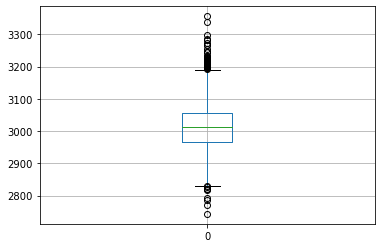

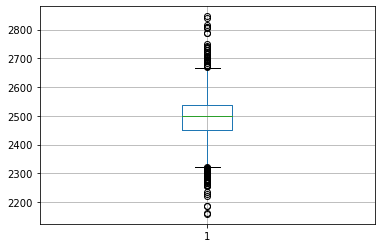

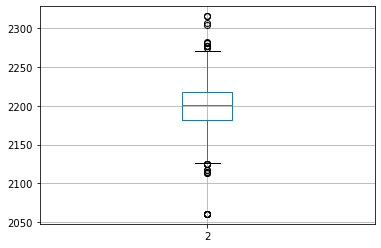

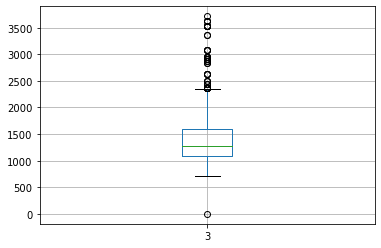

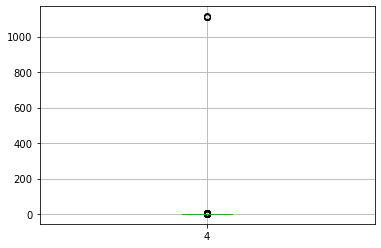

...

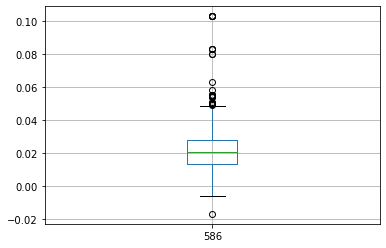

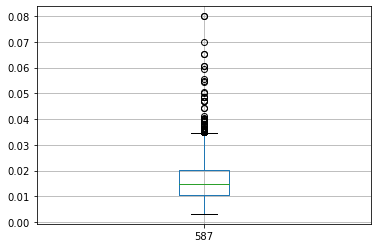

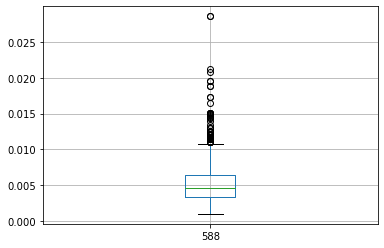

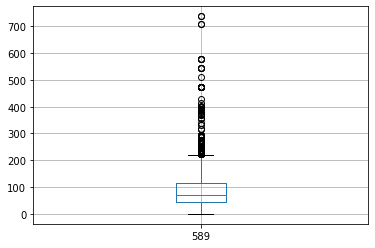

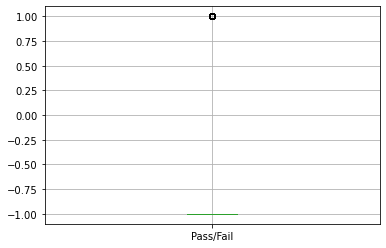

In [7]:
for i in df.columns:
    plt.figure()
    df.boxplot([i])

#1 Here we see that most of the data has outliers in its features

#2 There are columns where only a single unique value is present 

#3 Most of the columns have small boxes and the outlier values are quite distant from the avg range of values

#4 Some of the features are having very few outliers and a proper range of values, these features are reliable

In [8]:
df.shape

(1567, 591)

In [9]:
df.describe()

,0,1,2,3,4,5,6,7,8,9,...,581,582,583,584,585,586,587,588,589,Pass/Fail
count,1561.000000,1560.000000,1553.000000,1553.000000,1553.000000,1553.0,1553.000000,1558.000000,1565.000000,1565.000000,...,618.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1567.000000
mean,3014.452896,2495.850231,2200.547318,1396.376627,4.197013,100.0,101.112908,0.121822,1.462862,-0.000841,...,97.934373,0.500096,0.015318,0.003847,3.067826,0.021458,0.016475,0.005283,99.670066,-0.867262
std,73.621787,80.407705,29.513152,441.691640,56.355540,0.0,6.237214,0.008961,0.073897,0.015116,...,87.520966,0.003404,0.017180,0.003720,3.578033,0.012358,0.008808,0.002867,93.891919,0.498010
min,2743.240000,2158.750000,2060.660000,0.000000,0.681500,100.0,82.131100,0.000000,1.191000,-0.053400,...,0.000000,0.477800,0.006000,0.001700,1.197500,-0.016900,0.003200,0.001000,0.000000,-1.000000
25%,2966.260000,2452.247500,2181.044400,1081.875800,1.017700,100.0,97.920000,0.121100,1.411200,-0.010800,...,46.184900,0.497900,0.011600,0.003100,2.306500,0.013425,0.010600,0.003300,44.368600,-1.000000
50%,3011.490000,2499.405000,2201.066700,1285.214400,1.316800,100.0,101.512200,0.122400,1.461600,-0.001300,...,72.288900,0.500200,0.013800,0.003600,2.757650,0.020500,0.014800,0.004600,71.900500,-1.000000
75%,3056.650000,2538.822500,2218.055500,1591.223500,1.525700,100.0,104.586700,0.123800,1.516900,0.008400,...,116.539150,0.502375,0.016500,0.004100,3.295175,0.027600,0.020300,0.006400,114.749700,-1.000000
max,3356.350000,2846.440000,2315.266700,3715.041700,1114.536600,100.0,129.252200,0.128600,1.656400,0.074900,...,737.304800,0.509800,0.476600,0.104500,99.303200,0.102800,0.079900,0.028600,737.304800,1.000000


In [10]:
dfcolmat = np.array(df.columns)
dfcolmat = np.delete(dfcolmat,[-1])
dfcolmat = np.reshape(dfcolmat,(-1,5))
dfcolmat

array([['0', '1', '2', '3', '4'],
       ['5', '6', '7', '8', '9'],
       ['10', '11', '12', '13', '14'],
       ['15', '16', '17', '18', '19'],
       ['20', '21', '22', '23', '24'],
       ['25', '26', '27', '28', '29'],
       ['30', '31', '32', '33', '34'],
       ['35', '36', '37', '38', '39'],
       ['40', '41', '42', '43', '44'],
       ['45', '46', '47', '48', '49'],
       ['50', '51', '52', '53', '54'],
       ['55', '56', '57', '58', '59'],
       ['60', '61', '62', '63', '64'],
       ['65', '66', '67', '68', '69'],
       ['70', '71', '72', '73', '74'],
       ['75', '76', '77', '78', '79'],
       ['80', '81', '82', '83', '84'],
       ['85', '86', '87', '88', '89'],
       ['90', '91', '92', '93', '94'],
       ['95', '96', '97', '98', '99'],
       ['100', '101', '102', '103', '104'],
       ['105', '106', '107', '108', '109'],
       ['110', '111', '112', '113', '114'],
       ['115', '116', '117', '118', '119'],
       ['120', '121', '122', '123', '124'],
       ['1

<ipython-input-70-cb09d0ab1406>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


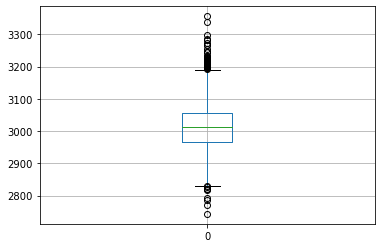

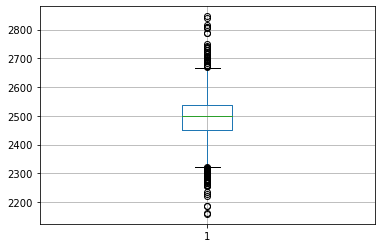

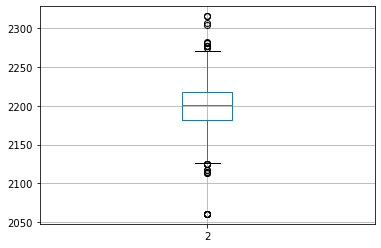

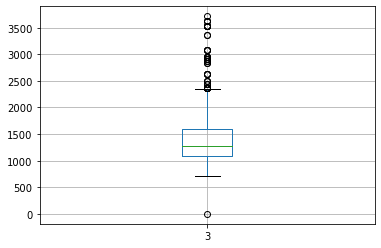

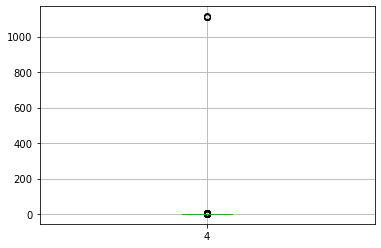

...

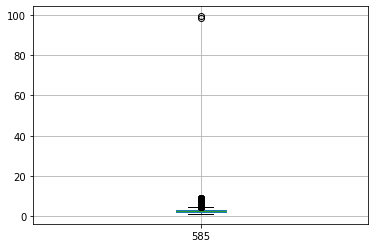

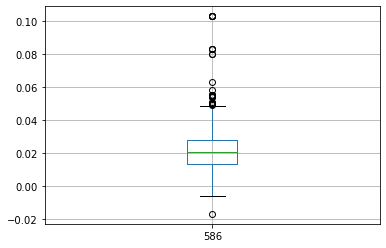

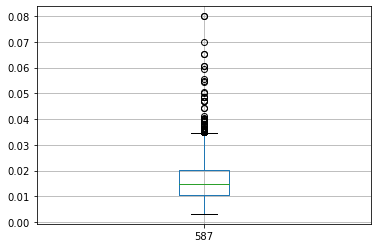

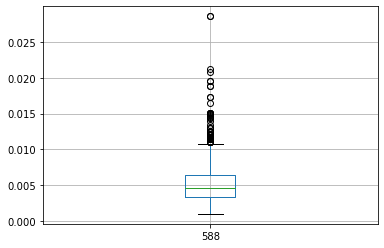

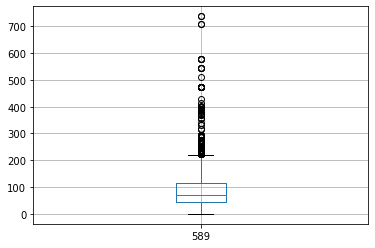

In [70]:
for i in range(len(dfcolmat)):
    for j in range(5):
        plt.figure()
        df.boxplot([dfcolmat[i][j]])

#1 Here we that most of the data has outliers in its features

#2 There are columns where only a single unique value is present 

#3 Most of the columns have small boxes and the outlier values are quite distant from the avg range of values

#4 Some of the features are having very few outliers and a proper range of values, these features are reliable

In [11]:
for i in df.columns:
    p = (df[i].isna().sum())/len(df)*100
    if p > 20:
        df.drop([i],axis=1, inplace=True)
    else:
        df[i].fillna(df[i].mean(),inplace=True)

In [12]:
df.shape

(1567, 559)

## After the loop to remove columns for 20%+ null values and imputing the remaining with the mean, we see that the number of columns has reduced to 559.

In [13]:
df

,0,1,2,3,4,5,6,7,8,9,...,577,582,583,584,585,586,587,588,589,Pass/Fail
0,3030.93,2564.00,2187.7333,1411.1265,1.3602,100.0,97.6133,0.1242,1.500500,0.016200,...,14.9509,0.5005,0.0118,0.0035,2.3630,0.021458,0.016475,0.005283,99.670066,-1
1,3095.78,2465.14,2230.4222,1463.6606,0.8294,100.0,102.3433,0.1247,1.496600,-0.000500,...,10.9003,0.5019,0.0223,0.0055,4.4447,0.009600,0.020100,0.006000,208.204500,-1
2,2932.61,2559.94,2186.4111,1698.0172,1.5102,100.0,95.4878,0.1241,1.443600,0.004100,...,9.2721,0.4958,0.0157,0.0039,3.1745,0.058400,0.048400,0.014800,82.860200,1
3,2988.72,2479.90,2199.0333,909.7926,1.3204,100.0,104.2367,0.1217,1.488200,-0.012400,...,8.5831,0.4990,0.0103,0.0025,2.0544,0.020200,0.014900,0.004400,73.843200,-1
4,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.0,100.3967,0.1235,1.503100,-0.003100,...,10.9698,0.4800,0.4766,0.1045,99.3032,0.020200,0.014900,0.004400,73.843200,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,2899.41,2464.36,2179.7333,3085.3781,1.4843,100.0,82.2467,0.1248,1.342400,-0.004500,...,11.7256,0.4988,0.0143,0.0039,2.8669,0.006800,0.013800,0.004700,203.172000,-1
1563,3052.31,2522.55,2198.5667,1124.6595,0.8763,100.0,98.4689,0.1205,1.433300,-0.006100,...,17.8379,0.4975,0.0131,0.0036,2.6238,0.006800,0.013800,0.004700,203.172000,-1
1564,2978.81,2379.78,2206.3000,1110.4967,0.8236,100.0,99.4122,0.1208,1.462862,-0.000841,...,17.7267,0.4987,0.0153,0.0041,3.0590,0.019700,0.008600,0.002500,43.523100,-1
1565,2894.92,2532.01,2177.0333,1183.7287,1.5726,100.0,98.7978,0.1213,1.462200,-0.007200,...,19.2104,0.5004,0.0178,0.0038,3.5662,0.026200,0.024500,0.007500,93.494100,-1


In [14]:
count = 0
for i in df.columns:
    if len(df[i].unique()) == 1:
        count = count+1
        df.drop([i],axis=1,inplace=True)
        
count

116

In [15]:
df.shape

(1567, 443)

## Here we see that upon dropping all the columns which have a single unique value, the number of columns has again reduced.
## Currently the no. of columns are 443 and the number of columns having only single value is 116

In [16]:
df

,0,1,2,3,4,6,7,8,9,10,...,577,582,583,584,585,586,587,588,589,Pass/Fail
0,3030.93,2564.00,2187.7333,1411.1265,1.3602,97.6133,0.1242,1.500500,0.016200,-0.003400,...,14.9509,0.5005,0.0118,0.0035,2.3630,0.021458,0.016475,0.005283,99.670066,-1
1,3095.78,2465.14,2230.4222,1463.6606,0.8294,102.3433,0.1247,1.496600,-0.000500,-0.014800,...,10.9003,0.5019,0.0223,0.0055,4.4447,0.009600,0.020100,0.006000,208.204500,-1
2,2932.61,2559.94,2186.4111,1698.0172,1.5102,95.4878,0.1241,1.443600,0.004100,0.001300,...,9.2721,0.4958,0.0157,0.0039,3.1745,0.058400,0.048400,0.014800,82.860200,1
3,2988.72,2479.90,2199.0333,909.7926,1.3204,104.2367,0.1217,1.488200,-0.012400,-0.003300,...,8.5831,0.4990,0.0103,0.0025,2.0544,0.020200,0.014900,0.004400,73.843200,-1
4,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.3967,0.1235,1.503100,-0.003100,-0.007200,...,10.9698,0.4800,0.4766,0.1045,99.3032,0.020200,0.014900,0.004400,73.843200,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,2899.41,2464.36,2179.7333,3085.3781,1.4843,82.2467,0.1248,1.342400,-0.004500,-0.005700,...,11.7256,0.4988,0.0143,0.0039,2.8669,0.006800,0.013800,0.004700,203.172000,-1
1563,3052.31,2522.55,2198.5667,1124.6595,0.8763,98.4689,0.1205,1.433300,-0.006100,-0.009300,...,17.8379,0.4975,0.0131,0.0036,2.6238,0.006800,0.013800,0.004700,203.172000,-1
1564,2978.81,2379.78,2206.3000,1110.4967,0.8236,99.4122,0.1208,1.462862,-0.000841,0.000146,...,17.7267,0.4987,0.0153,0.0041,3.0590,0.019700,0.008600,0.002500,43.523100,-1
1565,2894.92,2532.01,2177.0333,1183.7287,1.5726,98.7978,0.1213,1.462200,-0.007200,0.003200,...,19.2104,0.5004,0.0178,0.0038,3.5662,0.026200,0.024500,0.007500,93.494100,-1


In [17]:
df['Pass/Fail'].replace({-1:0},inplace = True)

In [18]:
df["Pass/Fail"].value_counts()

0    1463
1     104
Name: Pass/Fail, dtype: int64

## Here we are removing columns with high outlier percentage

In [19]:
for i in df.columns:
    
    if i != 'Pass/Fail' :
        
        data = df[i]
        q1, q2, q3 = data.quantile([0.25,0.5,0.75])
        IQR = q3 - q1
        a = data.loc[( data > q3 + 1.5*IQR) | (data < q1 - 1.5*IQR) ]
    #     b = data.loc[data < q1 - 1.5*IQR ]
        print('Column: ',i)
    #     print('Upper Outliers: %f ' %a.count())
    #     print(a)
    #     print('Lower Outliers: %f' %b.count())
    #     print(b)
        print('Outlier percentage : %.2f' %((a.count()/len(data))*100))
        print('------------------------------------')
    # print ('25% is {0:}, 50% is {1:}, 75% is {2:}'.format(q1,q2,q3))
    # print('Above upper whisker{0:}'.format(a))
    # print('below lower whisker{0:}'.format(b))

Column:  0
Outlier percentage : 3.25
------------------------------------
Column:  1
Outlier percentage : 5.55
------------------------------------
Column:  2
Outlier percentage : 1.98
------------------------------------
Column:  3
Outlier percentage : 3.25
------------------------------------
Column:  4
Outlier percentage : 3.96
------------------------------------
Column:  6
Outlier percentage : 6.51
------------------------------------
Column:  7
Outlier percentage : 0.77
------------------------------------
Column:  8
Outlier percentage : 0.38
------------------------------------
Column:  9
Outlier percentage : 1.66
------------------------------------
Column:  10
Outlier percentage : 1.91
------------------------------------
Column:  11
Outlier percentage : 0.51
------------------------------------
Column:  12
Outlier percentage : 0.77
------------------------------------
Column:  14
Outlier percentage : 0.70
------------------------------------
Column:  15
Outlier percentage : 0

In [20]:
q1,q2,q3 =df['0'].quantile([0.25,0.5,0.75])
q1,q2,q3

(2966.665, 3011.84, 3056.54)

In [21]:
data=df['0']
a = data.loc[data > (q3+1.5*(q3-q1))]
b = data.loc[data < (q1-1.5*(q3-q1))]

In [22]:
a.count(),b.count()

(41, 10)

## Lets remove all features which have more than 12% outliers in the data, as outliers can affect the model and its outcomes

In [23]:
for i in df.columns:
    
    if i != 'Pass/Fail' :
        
        data = df[i]
        q1, q2, q3 = data.quantile([0.25,0.5,0.75])
        IQR = q3 - q1
        a = data.loc[( data > q3 + 1.5*IQR) | (data < q1 - 1.5*IQR) ]
        p = (a.count()/len(data))*100
        
        if p >= 12:
            df.drop([i],inplace=True, axis = 1 )

In [24]:
df.shape

(1567, 425)

## Here the columns have reduced to 425 from 443

## We are going to check the multicollinearity and remove columns which have a correlation above 0.7 or below -0.7

In [25]:
dff = df.drop('Pass/Fail',axis=1)
dff

,0,1,2,3,4,6,7,8,9,10,...,576,577,582,583,584,585,586,587,588,589
0,3030.93,2564.00,2187.7333,1411.1265,1.3602,97.6133,0.1242,1.500500,0.016200,-0.003400,...,1.6765,14.9509,0.5005,0.0118,0.0035,2.3630,0.021458,0.016475,0.005283,99.670066
1,3095.78,2465.14,2230.4222,1463.6606,0.8294,102.3433,0.1247,1.496600,-0.000500,-0.014800,...,1.1065,10.9003,0.5019,0.0223,0.0055,4.4447,0.009600,0.020100,0.006000,208.204500
2,2932.61,2559.94,2186.4111,1698.0172,1.5102,95.4878,0.1241,1.443600,0.004100,0.001300,...,2.0952,9.2721,0.4958,0.0157,0.0039,3.1745,0.058400,0.048400,0.014800,82.860200
3,2988.72,2479.90,2199.0333,909.7926,1.3204,104.2367,0.1217,1.488200,-0.012400,-0.003300,...,1.7585,8.5831,0.4990,0.0103,0.0025,2.0544,0.020200,0.014900,0.004400,73.843200
4,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.3967,0.1235,1.503100,-0.003100,-0.007200,...,1.6597,10.9698,0.4800,0.4766,0.1045,99.3032,0.020200,0.014900,0.004400,73.843200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,2899.41,2464.36,2179.7333,3085.3781,1.4843,82.2467,0.1248,1.342400,-0.004500,-0.005700,...,1.4879,11.7256,0.4988,0.0143,0.0039,2.8669,0.006800,0.013800,0.004700,203.172000
1563,3052.31,2522.55,2198.5667,1124.6595,0.8763,98.4689,0.1205,1.433300,-0.006100,-0.009300,...,1.0187,17.8379,0.4975,0.0131,0.0036,2.6238,0.006800,0.013800,0.004700,203.172000
1564,2978.81,2379.78,2206.3000,1110.4967,0.8236,99.4122,0.1208,1.462862,-0.000841,0.000146,...,1.2237,17.7267,0.4987,0.0153,0.0041,3.0590,0.019700,0.008600,0.002500,43.523100
1565,2894.92,2532.01,2177.0333,1183.7287,1.5726,98.7978,0.1213,1.462200,-0.007200,0.003200,...,1.7085,19.2104,0.5004,0.0178,0.0038,3.5662,0.026200,0.024500,0.007500,93.494100


In [26]:
# Lets check for highly correlated variables
cor= dff.corr()

cor.loc[:,:] = np.tril(cor,k=-1)
cor=cor.stack()
cor[(cor > 0.7) | (cor< -0.7)]

17   11     0.793896
22   21    -0.725921
26   25     0.823111
27   25     0.980375
     26     0.790933
              ...   
577  576    0.859278
584  583    0.994771
585  583    0.999890
     584    0.995342
588  587    0.974276
Length: 749, dtype: float64

In [27]:
cor_del=cor[(cor >= 0.7) | (cor <= -0.7)]

In [28]:
cor_del = pd.DataFrame(cor_del)
gg = pd.DataFrame(cor_del.index)
gg[0][3][1]

'25'

In [29]:
g=[]
for i in range(len(cor_del)):
    g.append(gg[0][i][1])

In [30]:
g = np.array(g)
g

array(['11', '21', '25', '25', '26', '29', '32', '34', '32', '34', '35',
       '34', '36', '45', '46', '47', '53', '43', '50', '64', '46', '50',
       '46', '50', '62', '66', '94', '94', '96', '94', '96', '98', '99',
       '92', '93', '121', '121', '123', '122', '122', '122', '127', '4',
       '16', '16', '147', '16', '147', '148', '16', '147', '148', '152',
       '19', '26', '159', '26', '159', '163', '26', '159', '163', '164',
       '172', '184', '185', '67', '67', '196', '196', '197', '67', '196',
       '197', '198', '74', '201', '196', '197', '199', '200', '202', '67',
       '196', '197', '199', '203', '67', '196', '197', '198', '199',
       '204', '74', '202', '67', '196', '197', '199', '200', '203', '204',
       '205', '74', '202', '206', '89', '114', '114', '248', '117', '119',
       '135', '136', '137', '271', '138', '139', '4', '140', '4', '140',
       '142', '275', '143', '144', '145', '146', '16', '147', '148',
       '152', '154', '16', '147', '148', '152', '154

In [31]:
g = set(g)
g=list(g)
g

['156',
 '420',
 '554',
 '566',
 '221',
 '19',
 '184',
 '180',
 '343',
 '175',
 '176',
 '114',
 '340',
 '219',
 '153',
 '213',
 '143',
 '215',
 '253',
 '273',
 '391',
 '567',
 '365',
 '228',
 '252',
 '45',
 '363',
 '347',
 '431',
 '216',
 '583',
 '25',
 '288',
 '204',
 '334',
 '362',
 '309',
 '301',
 '271',
 '390',
 '333',
 '200',
 '142',
 '212',
 '336',
 '27',
 '238',
 '206',
 '227',
 '21',
 '386',
 '249',
 '304',
 '573',
 '166',
 '170',
 '407',
 '267',
 '122',
 '268',
 '552',
 '317',
 '559',
 '98',
 '294',
 '575',
 '319',
 '473',
 '53',
 '310',
 '62',
 '4',
 '553',
 '342',
 '366',
 '311',
 '393',
 '144',
 '173',
 '469',
 '320',
 '550',
 '239',
 '551',
 '94',
 '456',
 '171',
 '92',
 '475',
 '140',
 '572',
 '335',
 '26',
 '341',
 '387',
 '154',
 '137',
 '222',
 '321',
 '223',
 '167',
 '584',
 '332',
 '357',
 '560',
 '185',
 '34',
 '162',
 '99',
 '306',
 '43',
 '477',
 '168',
 '308',
 '565',
 '291',
 '210',
 '405',
 '564',
 '93',
 '367',
 '279',
 '217',
 '323',
 '278',
 '425',
 '135',
 

In [32]:
len(g)

238

In [33]:
dff[g]

,156,420,554,566,221,19,184,180,343,175,...,361,587,497,421,150,435,208,147,287,74
0,0.0506,3.464100,0.3363,2.61087,0.0707,12.5190,0.0803,20.95,2.9971,0.9499,...,55.2039,0.016475,22.37560,6.054400,4.271000,2.7073,97.314,0.032800,0.133700,0.0
1,0.0437,2.119600,0.4989,2.61087,0.0761,12.4608,0.0892,17.99,2.4890,1.0181,...,46.3453,0.020100,23.64690,6.149100,6.285000,5.7093,134.250,0.020400,0.166200,0.0
2,0.0497,2.294300,0.3752,0.41220,0.0963,12.5404,0.1959,17.78,5.6983,0.9677,...,58.0575,0.048400,9.01130,4.091700,4.819000,5.7650,79.618,0.022100,0.147900,0.0
3,0.0699,1.968900,17.4781,3.56110,0.0764,12.4782,0.1786,16.22,6.3292,0.8567,...,45.7058,0.014900,9.99790,6.571800,9.073000,5.3899,104.950,0.019000,0.388200,0.0
4,0.0538,2.504600,0.8311,2.61087,0.0802,12.4735,0.1189,15.24,6.3767,0.8285,...,21.0312,0.014900,15.60160,7.049200,9.005000,2.0088,92.307,0.024000,0.129300,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,0.0179,2.577100,0.3141,2.09020,0.0807,12.5373,0.1506,23.23,3.4104,0.6572,...,50.9032,0.013800,5.71740,6.185800,8.107000,8.1372,65.531,0.024700,0.145600,0.0
1563,0.0810,2.218500,0.5058,1.74200,0.0799,12.4020,0.0736,20.52,6.2556,0.6833,...,52.6728,0.013800,4.71310,6.268200,7.625000,2.3859,151.826,0.021300,0.070200,0.0
1564,0.0467,1.821261,0.5605,4.41280,0.0461,12.4555,0.1666,20.07,5.2936,0.8963,...,29.1159,0.008600,12.11100,4.174524,6.814268,3.8076,59.503,0.017411,0.367529,0.0
1565,0.0219,1.348600,0.5058,2.09020,0.0703,12.3937,0.0846,26.63,2.7687,0.6709,...,32.6117,0.024500,11.82103,1.882900,8.253000,9.7082,58.463,0.013100,0.118700,0.0


In [34]:
dff.drop(g , axis=1, inplace= True)
dff

,0,1,2,3,6,7,8,9,10,12,...,568,569,570,571,577,582,585,586,588,589
0,3030.93,2564.00,2187.7333,1411.1265,97.6133,0.1242,1.500500,0.016200,-0.003400,202.439600,...,2.452417,21.117674,533.8500,2.1113,14.9509,0.5005,2.3630,0.021458,0.005283,99.670066
1,3095.78,2465.14,2230.4222,1463.6606,102.3433,0.1247,1.496600,-0.000500,-0.014800,200.547000,...,2.452417,21.117674,535.0164,2.4335,10.9003,0.5019,4.4447,0.009600,0.006000,208.204500
2,2932.61,2559.94,2186.4111,1698.0172,95.4878,0.1241,1.443600,0.004100,0.001300,202.017900,...,0.411900,68.848900,535.0245,2.0293,9.2721,0.4958,3.1745,0.058400,0.014800,82.860200
3,2988.72,2479.90,2199.0333,909.7926,104.2367,0.1217,1.488200,-0.012400,-0.003300,201.848200,...,2.729000,25.036300,530.5682,2.0253,8.5831,0.4990,2.0544,0.020200,0.004400,73.843200
4,3032.24,2502.87,2233.3667,1326.5200,100.3967,0.1235,1.503100,-0.003100,-0.007200,201.942400,...,2.452417,21.117674,532.0155,2.0275,10.9698,0.4800,99.3032,0.020200,0.004400,73.843200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,2899.41,2464.36,2179.7333,3085.3781,82.2467,0.1248,1.342400,-0.004500,-0.005700,203.986700,...,1.884400,15.466200,536.3418,2.0153,11.7256,0.4988,2.8669,0.006800,0.004700,203.172000
1563,3052.31,2522.55,2198.5667,1124.6595,98.4689,0.1205,1.433300,-0.006100,-0.009300,204.017300,...,1.708900,20.911800,537.9264,2.1814,17.8379,0.4975,2.6238,0.006800,0.004700,203.172000
1564,2978.81,2379.78,2206.3000,1110.4967,99.4122,0.1208,1.462862,-0.000841,0.000146,199.956809,...,4.319700,29.095400,530.3709,2.3435,17.7267,0.4987,3.0590,0.019700,0.002500,43.523100
1565,2894.92,2532.01,2177.0333,1183.7287,98.7978,0.1213,1.462200,-0.007200,0.003200,197.244800,...,1.884400,15.466200,534.3936,1.9098,19.2104,0.5004,3.5662,0.026200,0.007500,93.494100


In [35]:
dff['Pass/Fail']= df['Pass/Fail']
dff

,0,1,2,3,6,7,8,9,10,12,...,569,570,571,577,582,585,586,588,589,Pass/Fail
0,3030.93,2564.00,2187.7333,1411.1265,97.6133,0.1242,1.500500,0.016200,-0.003400,202.439600,...,21.117674,533.8500,2.1113,14.9509,0.5005,2.3630,0.021458,0.005283,99.670066,0
1,3095.78,2465.14,2230.4222,1463.6606,102.3433,0.1247,1.496600,-0.000500,-0.014800,200.547000,...,21.117674,535.0164,2.4335,10.9003,0.5019,4.4447,0.009600,0.006000,208.204500,0
2,2932.61,2559.94,2186.4111,1698.0172,95.4878,0.1241,1.443600,0.004100,0.001300,202.017900,...,68.848900,535.0245,2.0293,9.2721,0.4958,3.1745,0.058400,0.014800,82.860200,1
3,2988.72,2479.90,2199.0333,909.7926,104.2367,0.1217,1.488200,-0.012400,-0.003300,201.848200,...,25.036300,530.5682,2.0253,8.5831,0.4990,2.0544,0.020200,0.004400,73.843200,0
4,3032.24,2502.87,2233.3667,1326.5200,100.3967,0.1235,1.503100,-0.003100,-0.007200,201.942400,...,21.117674,532.0155,2.0275,10.9698,0.4800,99.3032,0.020200,0.004400,73.843200,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,2899.41,2464.36,2179.7333,3085.3781,82.2467,0.1248,1.342400,-0.004500,-0.005700,203.986700,...,15.466200,536.3418,2.0153,11.7256,0.4988,2.8669,0.006800,0.004700,203.172000,0
1563,3052.31,2522.55,2198.5667,1124.6595,98.4689,0.1205,1.433300,-0.006100,-0.009300,204.017300,...,20.911800,537.9264,2.1814,17.8379,0.4975,2.6238,0.006800,0.004700,203.172000,0
1564,2978.81,2379.78,2206.3000,1110.4967,99.4122,0.1208,1.462862,-0.000841,0.000146,199.956809,...,29.095400,530.3709,2.3435,17.7267,0.4987,3.0590,0.019700,0.002500,43.523100,0
1565,2894.92,2532.01,2177.0333,1183.7287,98.7978,0.1213,1.462200,-0.007200,0.003200,197.244800,...,15.466200,534.3936,1.9098,19.2104,0.5004,3.5662,0.026200,0.007500,93.494100,0


## After removing the features which are having a lot of correlation with other features, the number of features has reduced to 187

## Univariate Analysis

### Here we perform PCA to find the 10 most contributing features that help in building the model 

In [46]:
x = dff.drop(['Pass/Fail'], axis =1 )
y = dff['Pass/Fail']
x_temp = x.copy()

In [47]:
from sklearn.decomposition import PCA
pca = PCA(10)
pca.fit(x)

PCA(n_components=10)

In [60]:
x_temp = pd.DataFrame(x_temp)

In [53]:
x_u = pca.transform(x_temp)
x_u = pd.DataFrame(x_u)
x_u

,0,1,2,3,4,5,6,7,8,9
0,-2505.003833,-19.286368,-1248.421643,2.321136,-144.087435,-192.949046,-285.888591,-134.639424,-30.688216,-267.024755
1,-233.466922,-1584.828724,-1713.350123,105.428647,-409.329762,-491.123443,-157.158581,-95.136571,113.162456,161.470782
2,-675.554757,-2097.678668,-1507.386006,248.138810,458.393391,-119.342762,-304.584806,-313.756931,-140.862547,-145.372345
3,-300.884365,-1648.514216,-270.696430,-488.278699,-714.801244,-208.774387,39.757235,134.478432,-552.636202,-75.558163
4,-1782.640223,-386.888687,-978.719422,-18.424660,246.455741,-493.813441,141.930388,47.345283,431.427730,-3.027571
...,...,...,...,...,...,...,...,...,...,...
1562,-2079.216700,-310.774684,1178.346562,1714.058383,535.015955,-296.664669,247.329575,-229.330884,348.437950,252.203572
1563,-2301.112365,-382.371181,-1600.418484,-218.167417,-173.276047,638.011327,675.433202,488.418645,-5.889227,452.905012
1564,-1205.158532,-1612.263867,41.985966,-276.436214,183.115290,-115.516634,-233.687139,251.993232,228.156123,-54.414529
1565,-2030.836499,-201.597286,-603.079776,-211.415514,-48.285324,405.262727,-60.141195,165.239255,-201.987080,56.119376


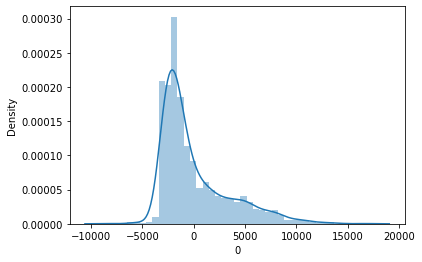

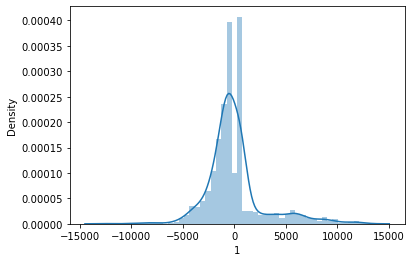

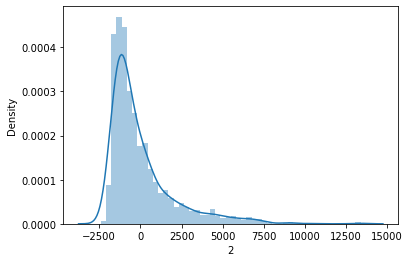

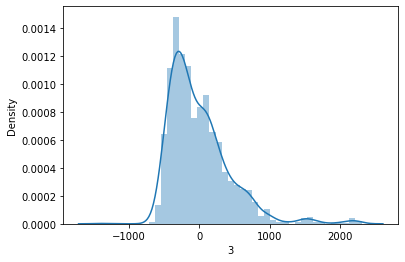

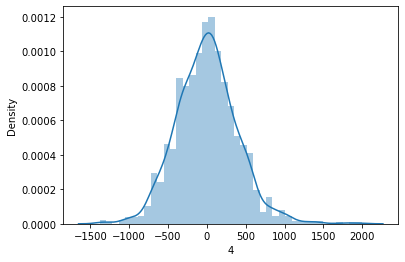

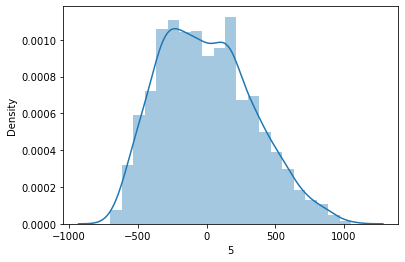

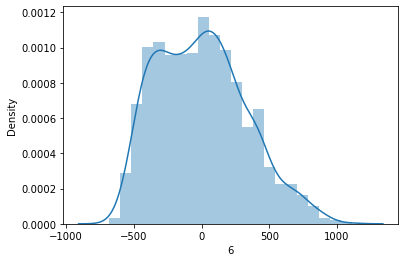

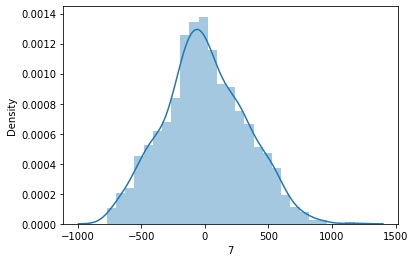

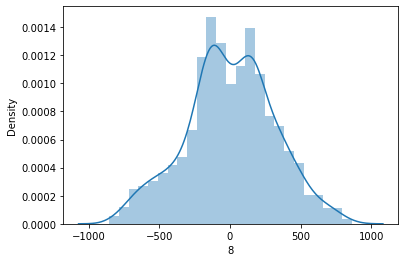

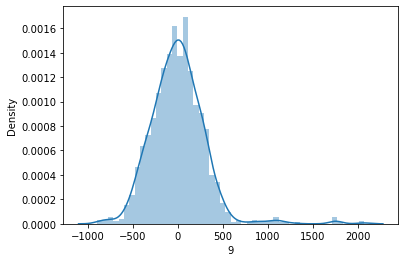

In [54]:
for i in x_u.columns:
    plt.figure()
    sns.distplot(x_u[i])

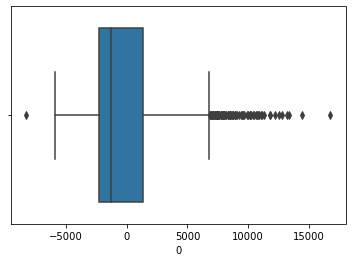

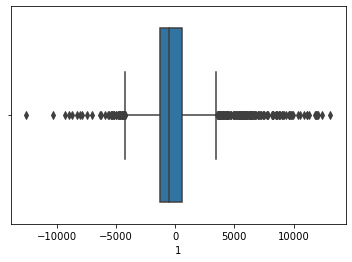

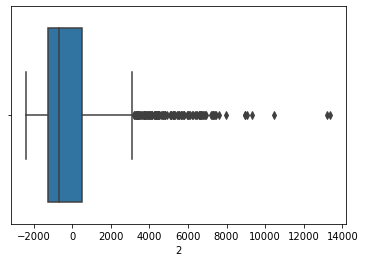

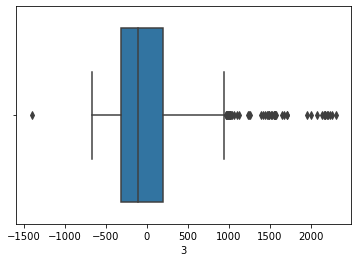

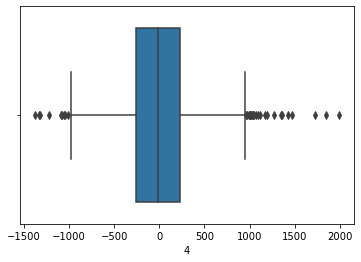

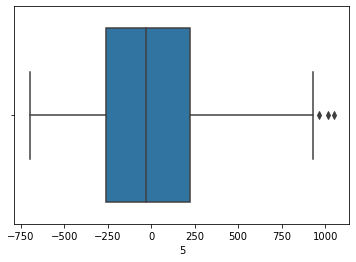

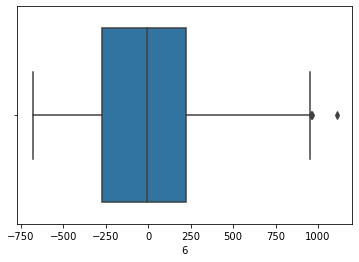

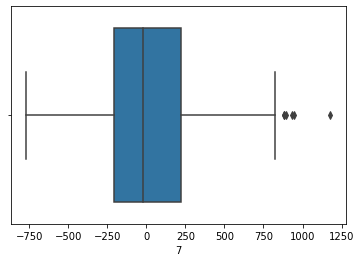

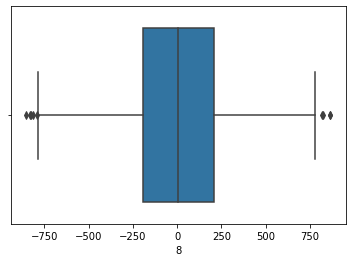

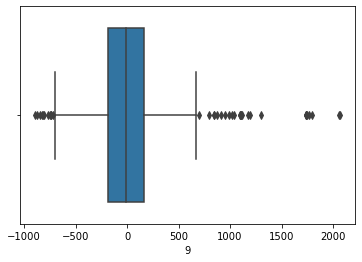

In [55]:
for i in x_u.columns:
    plt.figure()
    sns.boxplot(x_u[i])

In [67]:
for i in x_u.columns:
    
        
        data = x_u[i]
        q1, q2, q3 = data.quantile([0.25,0.5,0.75])
        IQR = q3 - q1
        a = data.loc[( data > (q3 + 1.5*IQR)) | (data < (q1 - 1.5*IQR)) ]
    #     b = data.loc[data < q1 - 1.5*IQR ]
        print('Column: ',i)
    #     print('Upper Outliers: %f ' %a.count())
    #     print(a)
    #     print('Lower Outliers: %f' %b.count())
    #     print(b)
        print('Outlier percentage : %.2f' %((a.count()/len(data))*100))
        print('------------------------------------')
    # print ('25% is {0:}, 50% is {1:}, 75% is {2:}'.format(q1,q2,q3))
    # print('Above upper whisker{0:}'.format(a))
    # print('below lower whisker{0:}'.format(b))

Column:  0
Outlier percentage : 5.68
------------------------------------
Column:  1
Outlier percentage : 13.08
------------------------------------
Column:  2
Outlier percentage : 7.91
------------------------------------
Column:  3
Outlier percentage : 3.25
------------------------------------
Column:  4
Outlier percentage : 2.11
------------------------------------
Column:  5
Outlier percentage : 0.19
------------------------------------
Column:  6
Outlier percentage : 0.19
------------------------------------
Column:  7
Outlier percentage : 0.38
------------------------------------
Column:  8
Outlier percentage : 0.57
------------------------------------
Column:  9
Outlier percentage : 2.36
------------------------------------


### Here the 1st principal component has a right skew and 5.68% of data is having outliers
### 2nd principal component has a right skew and has 13.08 % of data is having outliers
### 3rd principal component has right skew but has 7.91% outliers in data
### 4th principal component has a little right skew and outliers of 3.25% 
### 5th principal component has 2.11% of outliers and has a wide distribution
### 6th principal component has wide distribution and has 2 peaks  but has outliers(0.19%) with few outliers on the right
### 7th principal component has a wide distribution with two peaks and very low outlier(0.19%) values on the right
### 8th principal component has wide distribution and comparatively low percentage of outliers 0.38% 
### 9th component has a wide distribution and has 2 peaks and the outlier percentages as 0.57 
### 10th component has a wide distribution and 2.36% outliers

## Bivariate and Mulitvariate Analysis

In [68]:
x_u.columns

RangeIndex(start=0, stop=10, step=1)

In [69]:
x_uu=x_u.copy()
x_uu['Pass/Fail'] = y
x_uu

,0,1,2,3,4,5,6,7,8,9,Pass/Fail
0,-2505.003833,-19.286368,-1248.421643,2.321136,-144.087435,-192.949046,-285.888591,-134.639424,-30.688216,-267.024755,0
1,-233.466922,-1584.828724,-1713.350123,105.428647,-409.329762,-491.123443,-157.158581,-95.136571,113.162456,161.470782,0
2,-675.554757,-2097.678668,-1507.386006,248.138810,458.393391,-119.342762,-304.584806,-313.756931,-140.862547,-145.372345,1
3,-300.884365,-1648.514216,-270.696430,-488.278699,-714.801244,-208.774387,39.757235,134.478432,-552.636202,-75.558163,0
4,-1782.640223,-386.888687,-978.719422,-18.424660,246.455741,-493.813441,141.930388,47.345283,431.427730,-3.027571,0
...,...,...,...,...,...,...,...,...,...,...,...
1562,-2079.216700,-310.774684,1178.346562,1714.058383,535.015955,-296.664669,247.329575,-229.330884,348.437950,252.203572,0
1563,-2301.112365,-382.371181,-1600.418484,-218.167417,-173.276047,638.011327,675.433202,488.418645,-5.889227,452.905012,0
1564,-1205.158532,-1612.263867,41.985966,-276.436214,183.115290,-115.516634,-233.687139,251.993232,228.156123,-54.414529,0
1565,-2030.836499,-201.597286,-603.079776,-211.415514,-48.285324,405.262727,-60.141195,165.239255,-201.987080,56.119376,0


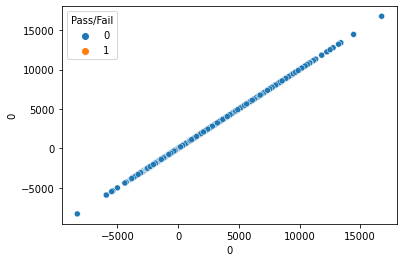

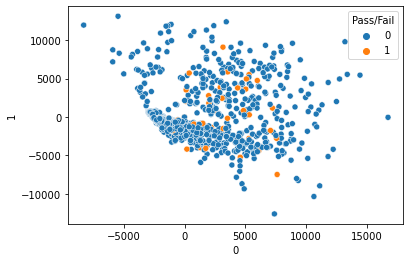

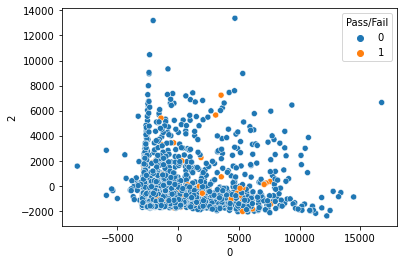

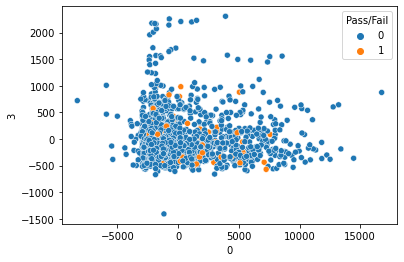

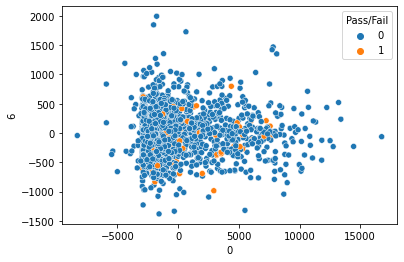

...

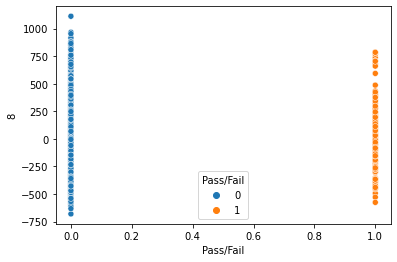

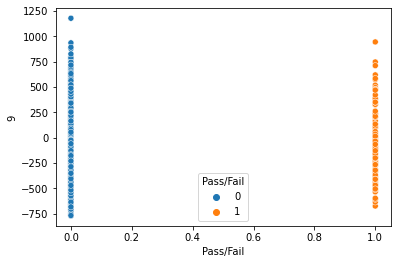

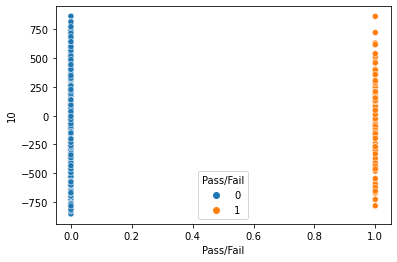

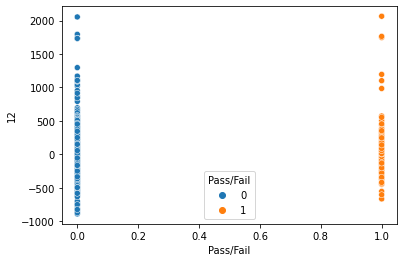

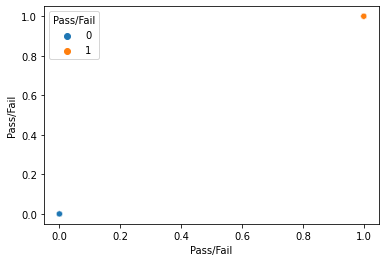

In [46]:
for i in x_uu.columns:
    for j in x_uu.columns:
        plt.figure()
        sns.scatterplot(x=i,y=j,data=x_uu,hue='Pass/Fail')

## Multivariate Analysis

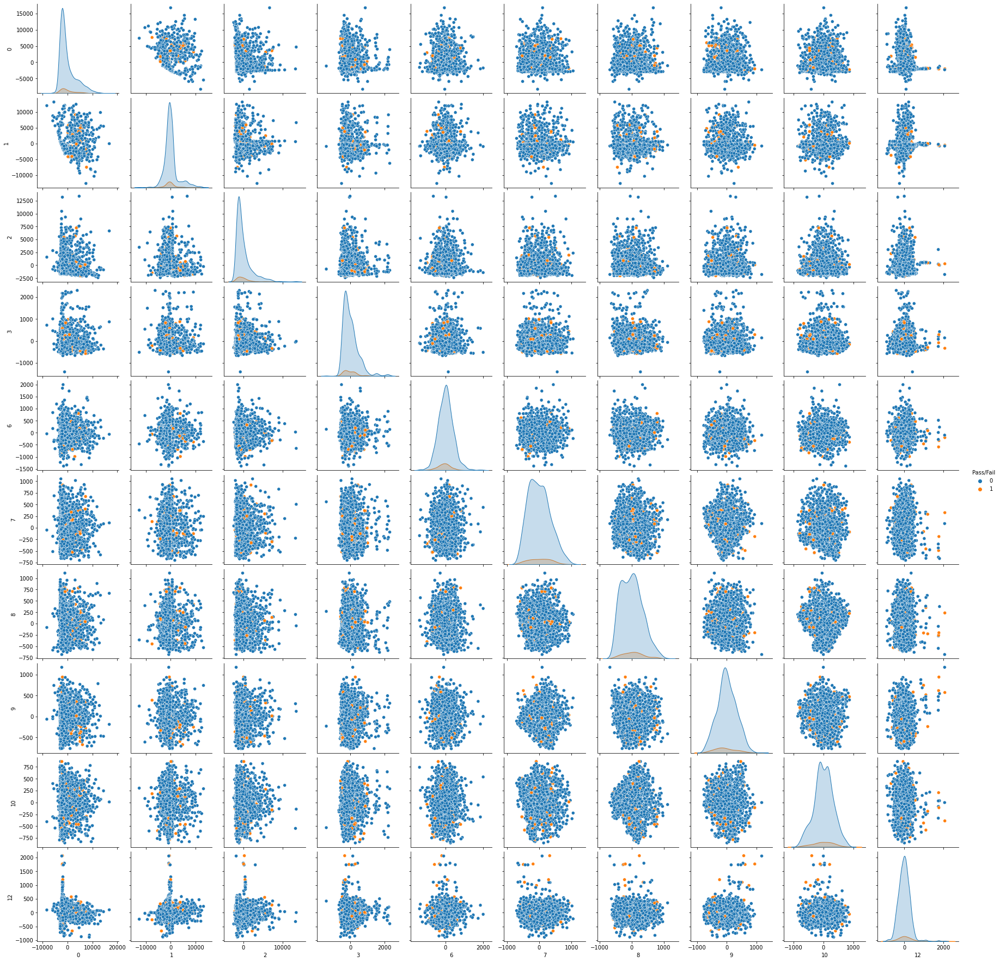

In [47]:
sns.pairplot(x_uu,hue='Pass/Fail')

### From the Bivariate and Multivariate analysis we understand that:
### Here the 4th and 5th principal components are having a negative correlation 
### 6th component and 7th components are not showing any correlation at all with other principal components  
### 

### Here we are going to do the Model building

In [70]:
dff.to_csv('cleaned_data.csv', index = False)

In [2]:
cdf = pd.read_csv('cleaned_data.csv')

In [3]:
x = cdf.drop(['Pass/Fail'], axis =1 )
y = cdf['Pass/Fail']

In [4]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(sampling_strategy= 'minority', random_state= 1 )

x_up, y_up = sm.fit_resample(x, y)

In [5]:
x_up.shape,y_up.shape

((2926, 186), (2926,))

In [6]:
y_up.value_counts()

0    1463
1    1463
Name: Pass/Fail, dtype: int64

In [7]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x = scaler.fit_transform(x_up)
y = y_up
x

array([[ 2.93793353e-01,  9.59065835e-01, -4.45059418e-01, ...,
        -1.49740396e-02, -7.02792150e-02, -1.90629898e-03],
       [ 1.19779353e+00, -4.13779255e-01,  1.10555573e+00, ...,
        -1.08564907e+00,  2.05922900e-01,  1.32376825e+00],
       [-1.07677407e+00,  9.02685590e-01, -4.93086501e-01, ...,
         3.32041018e+00,  3.59742794e+00, -2.07227424e-01],
       ...,
       [-6.70156607e-02, -1.19956695e-01, -6.48181457e-01, ...,
        -3.33393147e-01,  1.92459417e-02,  8.21921933e-02],
       [-4.76662516e-01, -1.08589084e+00, -7.00152991e-01, ...,
         3.76820377e-01,  4.97468877e-01, -2.41449621e-01],
       [-4.23937274e-01,  1.52061551e+00,  6.43385440e-01, ...,
         3.85752966e-01,  2.03110107e-01, -2.60924338e-01]])

In [8]:
cdf.columns

Index(['0', '1', '2', '3', '6', '7', '8', '9', '10', '12',
       ...
       '569', '570', '571', '577', '582', '585', '586', '588', '589',
       'Pass/Fail'],
      dtype='object', length=187)

In [9]:
x = pd.DataFrame(x,columns = cdf.drop(['Pass/Fail'],axis=1).columns)
x

,0,1,2,3,6,7,8,9,10,12,...,568,569,570,571,577,582,585,586,588,589
0,0.293793,0.959066,-0.445059,0.088997,-0.686317,0.327327,0.564039,1.369501,-0.463365,0.881797,...,-0.043263,-0.071306,0.193045,0.075947,-0.062702,0.049600,-0.263914,-0.014974,-0.070279,-0.001906
1,1.197794,-0.413779,1.105556,0.229802,0.199453,0.402818,0.501960,0.115149,-1.751275,0.208455,...,-0.043263,-0.071306,0.257921,1.188949,-0.473270,0.484744,0.502110,-1.085649,0.205923,1.323768
2,-1.076774,0.902686,-0.493087,0.857937,-1.084351,0.312229,-0.341668,0.460659,0.067616,0.731766,...,-2.507313,5.174222,0.258371,-0.207312,-0.638304,-1.411243,0.034701,3.320410,3.597428,-0.207227
3,-0.294608,-0.208811,-0.034603,-1.254705,0.554023,-0.050126,0.368253,-0.778671,-0.452067,0.671391,...,0.290729,0.359340,0.010509,-0.221130,-0.708140,-0.416626,-0.377473,-0.128595,-0.410714,-0.317364
4,0.312055,0.110168,1.212511,-0.137770,-0.165080,0.221641,0.605424,-0.080140,-0.892668,0.704905,...,-0.043263,-0.071306,0.091009,-0.213530,-0.466225,-6.322160,35.408146,-0.128595,-0.410714,-0.317364
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2921,0.152685,-0.304917,-0.256406,-0.956171,0.285412,-0.199858,0.781510,-1.056866,0.210397,-0.625900,...,-0.563896,-0.064555,0.054893,1.052362,0.033227,0.503041,-0.134251,1.484317,-0.233140,-0.765825
2922,-0.417450,0.024802,0.264768,-1.017935,2.628014,0.085419,0.876903,-0.323694,-0.424115,0.040910,...,1.966434,4.751791,0.033749,-0.278333,-0.185291,-0.850378,0.032523,-1.934622,-0.571319,-0.880386
2923,-0.067016,-0.119957,-0.648181,-0.761945,0.285908,0.193533,-0.173328,0.373845,1.263078,0.185930,...,0.943096,-0.393245,0.166889,-2.164313,-0.236387,-0.921838,-0.060974,-0.333393,0.019246,0.082192
2924,-0.476663,-1.085891,-0.700153,-0.064569,-0.215138,0.041447,0.695091,0.527618,-0.390899,-0.157330,...,0.399011,-0.328586,0.001669,0.628194,0.306183,-0.389605,-0.423706,0.376820,0.497469,-0.241450


In [10]:
x_train, x_test, y_train, y_test = train_test_split(x,y, stratify = y, random_state = 1)
x_train.shape, x_test.shape, y_train.shape, y_test.shape

((2194, 186), (732, 186), (2194,), (732,))

In [11]:
x_train.describe()

,0,1,2,3,6,7,8,9,10,12,...,568,569,570,571,577,582,585,586,588,589
count,2194.000000,2194.000000,2194.000000,2194.000000,2194.000000,2194.000000,2194.000000,2194.000000,2194.000000,2194.000000,...,2194.000000,2194.000000,2194.000000,2194.000000,2194.000000,2194.000000,2194.000000,2194.000000,2194.000000,2194.000000
mean,0.012441,-0.001791,-0.022640,-0.011685,0.008947,0.012197,0.023688,0.001345,0.028461,-0.006408,...,0.002831,0.005019,0.005338,0.005553,0.005094,0.017871,0.000805,0.015453,-0.006477,-0.007818
std,1.012117,0.990530,1.010529,0.983441,0.995139,0.919748,0.998596,1.001430,0.985802,1.017014,...,1.020639,1.017921,0.906922,1.001389,1.014808,1.007524,1.132918,1.005882,0.997981,0.986837
min,-3.716566,-4.611330,-5.060821,-3.693181,-3.585611,-18.424538,-4.362430,-3.858219,-3.796116,-3.160496,...,-2.557186,-2.034870,-11.857369,-3.831305,-1.113690,-7.005959,-0.692795,-2.494143,-1.643989,-1.219309
25%,-0.663222,-0.555114,-0.713350,-0.739996,-0.466639,-0.125616,-0.627785,-0.620431,-0.580747,-0.551735,...,-0.729178,-0.692387,0.030947,-0.373468,-0.407995,-0.639114,-0.270943,-0.588497,-0.680493,-0.627136
50%,-0.117084,0.036530,-0.083839,-0.211678,0.066929,0.040463,-0.004868,-0.020051,0.086765,-0.081218,...,-0.061337,-0.106062,0.111800,0.159973,-0.188252,0.080682,-0.116446,-0.040141,-0.140936,-0.284438
75%,0.552910,0.558815,0.599045,0.460234,0.515476,0.229545,0.705300,0.542166,0.643787,0.613764,...,0.464261,0.262417,0.209706,0.682501,0.089682,0.666306,0.081871,0.540255,0.437162,0.262223
max,4.830104,4.881242,4.187415,6.264077,5.238583,0.991645,3.045578,5.778512,4.394544,25.645776,...,12.387118,6.774369,3.288790,2.245991,8.249722,2.940203,35.408146,7.329202,8.915924,7.786370


In [12]:
y_train.describe

<bound method NDFrame.describe of 1186    0
402     0
2104    1
1269    0
357     0
       ..
2240    1
2475    1
704     0
2262    1
242     0
Name: Pass/Fail, Length: 2194, dtype: int64>

In [13]:
x_test.describe()

,0,1,2,3,6,7,8,9,10,12,...,568,569,570,571,577,582,585,586,588,589
count,732.000000,732.000000,732.000000,732.000000,732.000000,732.000000,732.000000,732.000000,732.000000,732.000000,...,732.000000,732.000000,732.000000,732.000000,732.000000,732.000000,732.000000,732.000000,732.000000,732.000000
mean,-0.037289,0.005367,0.067859,0.035023,-0.026815,-0.036557,-0.070998,-0.004030,-0.085306,0.019207,...,-0.008486,-0.015043,-0.016000,-0.016643,-0.015268,-0.053563,-0.002413,-0.046316,0.019415,0.023434
std,0.963192,1.029197,0.965961,1.048633,1.015319,1.209603,1.002210,0.997060,1.038076,0.948310,...,0.936764,0.945487,1.238899,0.997008,0.955467,0.976520,0.390155,0.982078,1.007141,1.039452
min,-3.099727,-4.668544,-3.156817,-1.516467,-3.563963,-18.424538,-4.211214,-2.926844,-4.022065,-6.356683,...,-2.507313,-2.030430,-11.732772,-3.815760,-1.033105,-2.747758,-0.604517,-3.478284,-1.721069,-1.219309
25%,-0.666884,-0.577174,-0.603303,-0.717709,-0.504874,-0.151573,-0.723688,-0.585617,-0.726031,-0.528667,...,-0.729178,-0.692387,0.046889,-0.438497,-0.423588,-0.668386,-0.247068,-0.628207,-0.701913,-0.595832
50%,-0.180730,0.028055,0.008583,-0.140585,-0.030958,0.025365,-0.061289,-0.014432,-0.008210,-0.064987,...,-0.043263,-0.071306,0.131446,0.178197,-0.209390,-0.046843,-0.086004,-0.137422,-0.110967,-0.257425
75%,0.524029,0.499746,0.628710,0.520965,0.520109,0.221641,0.546061,0.522465,0.587299,0.661474,...,0.458846,0.254947,0.238554,0.674765,0.100756,0.546908,0.114516,0.531669,0.562241,0.298080
max,3.452570,4.372293,4.183364,6.008643,4.147233,0.732971,2.921422,3.667895,5.908404,3.791477,...,3.951453,6.927467,3.144527,2.245991,8.249722,2.722631,2.240079,5.550526,6.063977,5.855003


### It is seen here that the data in the Train and Test sets are having similar statistical characteristics in the mean, count, standard deviation, and the quartiles. A variation is seen the outlier values. 

In [14]:
from sklearn.decomposition import PCA
pca = PCA(n_components=10)
pca.fit(x)

PCA(n_components=10)

In [15]:
pca.explained_variance_ratio_*100

array([4.09004279, 2.6983428 , 2.35241481, 2.32431069, 2.00039049,
       1.95766675, 1.87455468, 1.75586312, 1.731951  , 1.59915683])

In [16]:
x_trainp =  pca.transform(x_train)
x_testp = pca.transform(x_test)

In [17]:
x_train.shape,x_trainp.shape

((2194, 186), (2194, 10))

In [18]:
x_test.shape,x_testp.shape

((732, 186), (732, 10))

### Logistic Regression

In [39]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()
lrm = lr.fit(x_train,y_train)
score1 = lr.score(x_test,y_test)
print('The score for Logistic Regression is : {}'.format(score1))

The score for Logistic Regression is : 0.8866120218579235


In [162]:
s1 = lr.score(x_train,y_train)

In [40]:
from sklearn.metrics import classification_report
y_pred = lr.predict(x_test)
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.93      0.83      0.88       366
           1       0.85      0.94      0.89       366

    accuracy                           0.89       732
   macro avg       0.89      0.89      0.89       732
weighted avg       0.89      0.89      0.89       732



In [41]:
from sklearn.model_selection import KFold,StratifiedKFold
from sklearn.model_selection import cross_val_score

In [42]:
kfold = KFold(n_splits=10)

In [43]:
results = cross_val_score(lrm,x, y, cv=kfold)
results

array([0.36177474, 0.61433447, 0.68259386, 0.55290102, 0.79522184,
       0.92491468, 0.91438356, 0.88356164, 0.93493151, 0.90068493])

In [44]:
print('Accuracy Score')
print('Avearge: ', results.mean())
print('Standard deviation: ', results.std())

Accuracy Score
Avearge:  0.7565302258170088
Standard deviation:  0.1861439171511062


In [45]:
stratified_kfold = StratifiedKFold(n_splits = 10)
results = cross_val_score(lrm, x, y, cv = stratified_kfold)

In [46]:
results

array([0.54948805, 0.79863481, 0.79863481, 0.81911263, 0.81911263,
       0.88054608, 0.85616438, 0.82534247, 0.90410959, 0.91438356])

In [47]:
print('Accuracy Score')
print('Avearge: ', results.mean())
print('Standard deviation: ', results.std())

Accuracy Score
Avearge:  0.8165529010238908
Standard deviation:  0.0974460448150392


In [48]:
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
param_grid = {'C': [0.01, 0.1, 1, 10, 100],
              'penalty': ['l1', 'l2'],
              'max_iter': list(range(100,800,100))}
grid1 = GridSearchCV(LogisticRegression(), param_grid)

In [49]:
grid1.fit(x_train,y_train)

GridSearchCV(estimator=LogisticRegression(),
             param_grid={'C': [0.01, 0.1, 1, 10, 100],
                         'max_iter': [100, 200, 300, 400, 500, 600, 700],
                         'penalty': ['l1', 'l2']})

In [50]:
grid1.best_params_

{'C': 100, 'max_iter': 100, 'penalty': 'l2'}

In [52]:
grid1.score(x_test,y_test)

0.8852459016393442

In [53]:
if score1 <  grid1.score(x_test,y_test):
    score1 = grid1.score(x_test,y_test)

In [54]:
grid2 = RandomizedSearchCV(LogisticRegression(), param_grid, n_iter=10)

In [55]:
grid2.fit(x_train,y_train)

RandomizedSearchCV(estimator=LogisticRegression(),
                   param_distributions={'C': [0.01, 0.1, 1, 10, 100],
                                        'max_iter': [100, 200, 300, 400, 500,
                                                     600, 700],
                                        'penalty': ['l1', 'l2']})

In [56]:
grid2.best_params_

{'penalty': 'l2', 'max_iter': 200, 'C': 100}

In [57]:
grid2.score(x_test,y_test)

0.8852459016393442

In [58]:
if score1 <  grid2.score(x_test,y_test):
    score1 = grid2.score(x_test,y_test)

In [59]:
grid1.fit(x_trainp,y_train)
grid1.score(x_testp ,y_test)

0.703551912568306

In [60]:
grid2.fit(x_trainp,y_train)
grid2.score(x_testp,y_test)

0.7021857923497268

### Decision Tree Classifier

In [61]:
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier()
dtm = dt.fit(x_train, y_train)

In [160]:
s2 = dt.score(x_train,y_train)

In [62]:
dt.score(x_test,y_test)

0.8852459016393442

In [63]:
score2=dt.score(x_test,y_test)

In [64]:
y_pred = dt.predict(x_test)
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.91      0.85      0.88       366
           1       0.86      0.92      0.89       366

    accuracy                           0.89       732
   macro avg       0.89      0.89      0.89       732
weighted avg       0.89      0.89      0.89       732



In [65]:
kfold = KFold(n_splits=10)

In [66]:
results = cross_val_score(dtm,x, y, cv=kfold)
results

array([0.66211604, 0.73037543, 0.79522184, 0.86006826, 0.83276451,
       0.94880546, 0.93835616, 0.96232877, 0.9109589 , 0.95205479])

In [67]:
print('Accuracy Score')
print('Avearge: ', results.mean())
print('Standard deviation: ', results.std())

Accuracy Score
Avearge:  0.8593050165973164
Standard deviation:  0.09821502825705629


In [68]:
stratified_kfold = StratifiedKFold(n_splits = 10)
results = cross_val_score(dtm, x, y, cv = stratified_kfold)

In [69]:
results

array([0.67918089, 0.86006826, 0.86006826, 0.92150171, 0.88737201,
       0.88054608, 0.87671233, 0.8869863 , 0.88013699, 0.90068493])

In [70]:
print('Accuracy Score')
print('Avearge: ', results.mean())
print('Standard deviation: ', results.std())

Accuracy Score
Avearge:  0.8633257749310392
Standard deviation:  0.06372370478722812


In [71]:
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
param_griddt = {'max_depth': range(2, 10),
               'max_features': range(2, 14) }
grid3 = GridSearchCV(dt, param_griddt)

In [72]:
grid3.fit(x_train,y_train)

GridSearchCV(estimator=DecisionTreeClassifier(),
             param_grid={'max_depth': range(2, 10),
                         'max_features': range(2, 14)})

In [73]:
grid3.best_params_

{'max_depth': 9, 'max_features': 12}

In [74]:
grid3.score(x_test,y_test)

0.8510928961748634

In [75]:
if score2 <  grid3.score(x_test,y_test):
    score2 = grid3.score(x_test,y_test)

In [76]:
grid4 = RandomizedSearchCV(dt, param_griddt, n_iter=10)

In [77]:
grid4.fit(x_train,y_train)

RandomizedSearchCV(estimator=DecisionTreeClassifier(),
                   param_distributions={'max_depth': range(2, 10),
                                        'max_features': range(2, 14)})

In [78]:
grid4.best_params_

{'max_features': 10, 'max_depth': 9}

In [79]:
grid4.score(x_test,y_test)

0.837431693989071

In [80]:
if score2 <  grid4.score(x_test,y_test):
    score2 = grid4.score(x_test,y_test)

In [81]:
grid3.fit(x_trainp,y_train)
grid3.score(x_testp ,y_test)

0.7773224043715847

In [82]:
grid4.fit(x_trainp,y_train)
grid4.score(x_testp,y_test)

0.7841530054644809

### Random Forest Classifier

In [83]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier()
rfm = rf.fit(x_train, y_train)
print('Accuracy of Random Forest classifier: ',rf.score(x_test,y_test))

Accuracy of Random Forest classifier:  0.9931693989071039


In [159]:
s3 = rf.score(x_train,y_train)

In [84]:
score3 = rf.score(x_test,y_test)

In [85]:
param_gridrf = {'bootstrap': [True],
 'max_depth': [10, 20, 30, 40, 50],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4, 8],
 'n_estimators': [100]}

In [86]:
y_pred = rf.predict(x_test)
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99       366
           1       0.99      0.99      0.99       366

    accuracy                           0.99       732
   macro avg       0.99      0.99      0.99       732
weighted avg       0.99      0.99      0.99       732



In [87]:
kfold = KFold(n_splits=10)

In [88]:
results = cross_val_score(rfm,x, y, cv=kfold)
results

array([0.64163823, 0.96587031, 0.98976109, 0.99317406, 0.98634812,
       1.        , 0.98972603, 0.99657534, 0.99657534, 0.99315068])

In [89]:
print('Accuracy Score')
print('Avearge: ', results.mean())
print('Standard deviation: ', results.std())

Accuracy Score
Avearge:  0.9552819206133994
Standard deviation:  0.1049307666507859


In [90]:
stratified_kfold = StratifiedKFold(n_splits = 10)
results = cross_val_score(rfm, x, y, cv = stratified_kfold)

In [91]:
results

array([0.83617747, 0.94539249, 0.99317406, 1.        , 0.99317406,
       0.99658703, 0.99315068, 1.        , 1.        , 0.99657534])

In [92]:
print('Accuracy Score')
print('Avearge: ', results.mean())
print('Standard deviation: ', results.std())

Accuracy Score
Avearge:  0.9754231146851187
Standard deviation:  0.04893162943686836


In [93]:
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

param_gridrf = {'bootstrap': [True],
                'max_depth': [10, 20, 30, 40, 50],
                'max_features': ['auto', 'sqrt'],
                'min_samples_leaf': [1, 2, 4, 8],
                'n_estimators': [100]}

grid5 = GridSearchCV(rf, param_gridrf)

In [94]:
grid5.fit(x_train,y_train)

GridSearchCV(estimator=RandomForestClassifier(),
             param_grid={'bootstrap': [True], 'max_depth': [10, 20, 30, 40, 50],
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_leaf': [1, 2, 4, 8],
                         'n_estimators': [100]})

In [95]:
grid5.best_params_

{'bootstrap': True,
 'max_depth': 40,
 'max_features': 'auto',
 'min_samples_leaf': 1,
 'n_estimators': 100}

In [96]:
grid5.score(x_test,y_test)

0.9931693989071039

In [97]:
if score3 <  grid5.score(x_test,y_test):
    score3 = grid5.score(x_test,y_test)

In [98]:
grid6 = RandomizedSearchCV(rf, param_gridrf, n_iter=10)

In [99]:
grid6.fit(x_train,y_train)

RandomizedSearchCV(estimator=RandomForestClassifier(),
                   param_distributions={'bootstrap': [True],
                                        'max_depth': [10, 20, 30, 40, 50],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4, 8],
                                        'n_estimators': [100]})

In [100]:
grid6.best_params_

{'n_estimators': 100,
 'min_samples_leaf': 1,
 'max_features': 'auto',
 'max_depth': 40,
 'bootstrap': True}

In [101]:
grid6.score(x_test,y_test)

0.9931693989071039

In [102]:
if score3 <  grid6.score(x_test,y_test):
    score3 = grid6.score(x_test,y_test)

In [103]:
grid5.fit(x_trainp,y_train)
grid5.score(x_testp ,y_test)

0.8920765027322405

In [104]:
grid6.fit(x_trainp,y_train)
grid6.score(x_testp,y_test)

0.9030054644808743

### KNN classifier

In [105]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()
knnm = knn.fit(x_train,y_train)
print('Accuracy of Random Forest classifier: ',knn.score(x_test,y_test))

Accuracy of Random Forest classifier:  0.6120218579234973


In [158]:
s4 = knn.score(x_train,y_train)

In [106]:
score4 = knn.score(x_test,y_test)

In [107]:
grid_params = {'n_neighbors' : [5,7,9,11,13,15],
               'weights' : ['uniform','distance'],
               'metric' : ['minkowski','euclidean','manhattan']}

In [108]:
y_pred = knn.predict(x_test)
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      0.22      0.37       366
           1       0.56      1.00      0.72       366

    accuracy                           0.61       732
   macro avg       0.78      0.61      0.54       732
weighted avg       0.78      0.61      0.54       732



In [109]:
kfold = KFold(n_splits=10)

In [110]:
results = cross_val_score(knnm,x, y, cv=kfold)
results

array([0.18771331, 0.1331058 , 0.08532423, 0.05119454, 0.1331058 ,
       0.72354949, 1.        , 1.        , 1.        , 1.        ])

In [111]:
print('Accuracy Score')
print('Avearge: ', results.mean())
print('Standard deviation: ', results.std())

Accuracy Score
Avearge:  0.5313993174061433
Standard deviation:  0.42192928527690293


In [112]:
stratified_kfold = StratifiedKFold(n_splits = 10)
results = cross_val_score(knnm, x, y, cv = stratified_kfold)

In [113]:
results

array([0.51194539, 0.52559727, 0.54948805, 0.53583618, 0.53583618,
       0.56313993, 0.53424658, 0.52739726, 0.55136986, 0.57534247])

In [114]:
print('Accuracy Score')
print('Avearge: ', results.mean())
print('Standard deviation: ', results.std())

Accuracy Score
Avearge:  0.5410199167796531
Standard deviation:  0.017929156181956073


In [115]:
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

param_gridknn = {'n_neighbors' : [5,7,9,11,13,15],
               'weights' : ['uniform','distance'],
               'metric' : ['minkowski','euclidean','manhattan']}
grid7 = GridSearchCV(knn, param_gridknn)

In [116]:
grid7.fit(x_train,y_train)

GridSearchCV(estimator=KNeighborsClassifier(),
             param_grid={'metric': ['minkowski', 'euclidean', 'manhattan'],
                         'n_neighbors': [5, 7, 9, 11, 13, 15],
                         'weights': ['uniform', 'distance']})

In [117]:
grid7.best_params_

{'metric': 'manhattan', 'n_neighbors': 5, 'weights': 'uniform'}

In [118]:
grid7.score(x_test,y_test)

0.7581967213114754

In [119]:
if score4 <  grid7.score(x_test,y_test):
    score4 = grid7.score(x_test,y_test)

In [120]:
grid8 = RandomizedSearchCV(knn, param_gridknn, n_iter=10)

In [121]:
grid8.fit(x_train,y_train)

RandomizedSearchCV(estimator=KNeighborsClassifier(),
                   param_distributions={'metric': ['minkowski', 'euclidean',
                                                   'manhattan'],
                                        'n_neighbors': [5, 7, 9, 11, 13, 15],
                                        'weights': ['uniform', 'distance']})

In [122]:
grid8.best_params_

{'weights': 'distance', 'n_neighbors': 5, 'metric': 'manhattan'}

In [123]:
grid8.score(x_test,y_test)

0.7581967213114754

In [124]:
if score4 <  grid8.score(x_test,y_test):
    score4 = grid8.score(x_test,y_test)

In [125]:
grid7.fit(x_trainp,y_train)
grid7.score(x_testp ,y_test)

0.8647540983606558

In [126]:
grid8.fit(x_trainp,y_train)
grid8.score(x_testp,y_test)

0.8838797814207651

### SVC Classifier

In [127]:
from sklearn.svm import SVC
svc = SVC()
svcm = svc.fit(x_train, y_train)
print('Accuracy of Random Forest classifier: ',svc.score(x_test,y_test))

Accuracy of Random Forest classifier:  0.994535519125683


In [163]:
s5 = svc.score(x_train,y_train)

In [128]:
score5 = svc.score(x_test,y_test)

In [129]:
{'C': [0.1, 1, 10, 100, 1000],
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf','linear','poly','sigmoid','precomputed']}

{'C': [0.1, 1, 10, 100, 1000],
 'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
 'kernel': ['rbf', 'linear', 'poly', 'sigmoid', 'precomputed']}

In [130]:
from sklearn.model_selection import KFold,StratifiedKFold
from sklearn.model_selection import cross_val_score

In [131]:
from sklearn.metrics import classification_report
y_pred = svc.predict(x_test)
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99       366
           1       0.99      1.00      0.99       366

    accuracy                           0.99       732
   macro avg       0.99      0.99      0.99       732
weighted avg       0.99      0.99      0.99       732



In [132]:
kfold = KFold(n_splits=10)

In [133]:
results = cross_val_score(svcm,x, y, cv=kfold)
results

array([0.66894198, 0.97269625, 0.98976109, 0.98293515, 0.97610922,
       1.        , 1.        , 1.        , 1.        , 1.        ])

In [134]:
print('Accuracy Score')
print('Avearge: ', results.mean())
print('Standard deviation: ', results.std())

Accuracy Score
Avearge:  0.9590443686006825
Standard deviation:  0.09723069695874077


In [135]:
stratified_kfold = StratifiedKFold(n_splits = 10)
results = cross_val_score(svcm, x, y, cv = stratified_kfold)

In [136]:
results

array([0.82593857, 0.94539249, 0.99317406, 0.99658703, 1.        ,
       1.        , 1.        , 0.99315068, 1.        , 1.        ])

In [137]:
print('Accuracy Score')
print('Avearge: ', results.mean())
print('Standard deviation: ', results.std())

Accuracy Score
Avearge:  0.9754242835102156
Standard deviation:  0.05229231215529233


In [154]:
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

param_gridsvc ={'C': [0.1, 1, 10, 100, 1000],
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001]}
grid9 = GridSearchCV(svc, param_gridsvc,refit=True)

In [155]:
grid9.fit(x_train,y_train)

GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001]})

In [140]:
grid9.best_params_

{'C': 1, 'gamma': 0.01}

In [141]:
grid9.score(x_test,y_test)

1.0

In [142]:
if score5 <  grid9.score(x_test,y_test):
    score5 = grid9.score(x_test,y_test)

In [143]:
grid10 = RandomizedSearchCV(svc, param_gridsvc, n_iter=10)

In [144]:
grid10.fit(x_train,y_train)

RandomizedSearchCV(estimator=SVC(),
                   param_distributions={'C': [0.1, 1, 10, 100, 1000],
                                        'gamma': [1, 0.1, 0.01, 0.001, 0.0001]})

In [145]:
grid10.best_params_

{'gamma': 0.001, 'C': 100}

In [146]:
grid10.score(x_test,y_test)

0.9754098360655737

In [147]:
if score5 <  grid10.score(x_test,y_test):
    score5 = grid10.score(x_test,y_test)

In [148]:
grid9.fit(x_trainp,y_train)
grid9.score(x_testp ,y_test)

0.9357923497267759

In [149]:
grid10.fit(x_trainp,y_train)
grid10.score(x_testp,y_test)

0.9357923497267759

In [164]:
score_list = pd.DataFrame(
                          {'Classifier':['Logistic Regression','Decision Tree','Random Forest','KNN','SVC'],
                            'Test Accuracy':[score1,score2,score3,score4,score5],
                           'Train Accuracy':[s1,s2,s3,s4,s5]
                          }
                         )

In [165]:
score_list

,Classifier,Test Accuracy,Train Accuracy
0,Logistic Regression,0.886612,0.917958
1,Decision Tree,0.885246,1.000000
2,Random Forest,0.993169,1.000000
3,KNN,0.758197,0.665907
4,SVC,1.000000,0.999544


In [167]:
score_list.sort_values('Test Accuracy', ascending=False,inplace=True)
score_list

,Classifier,Test Accuracy,Train Accuracy
4,SVC,1.000000,0.999544
2,Random Forest,0.993169,1.000000
0,Logistic Regression,0.886612,0.917958
1,Decision Tree,0.885246,1.000000
3,KNN,0.758197,0.665907


### Here we see that the hyperparameter tuned SVC classifier is the best classifier for this dataset, because it has the highest test accuracy compared to others.
### But Random Forest is also a good classifier as it is having almost equal training and test accuracies as SVC.
### Best Parameters for SVC are {'C': 1, 'gamma': 0.01}

In [156]:
from sklearn.metrics import classification_report
y_pred = grid9.predict(x_test)
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       366
           1       1.00      1.00      1.00       366

    accuracy                           1.00       732
   macro avg       1.00      1.00      1.00       732
weighted avg       1.00      1.00      1.00       732



In [168]:
import pickle
with open('best_Model.pkl', 'wb') as handle:
        pickle.dump(grid9, handle, protocol=pickle.HIGHEST_PROTOCOL)

### Here i have pickled the best model as well!